In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/1e5ba644-efeb-4bd3-b878-a0606cf8a992___RS_Late.B 6272_flipLR.JPG
/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/3dcee9ed-43bb-45a9-8cff-641b3dd62179___RS_Late.B 5324.JPG
/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/532b2c20-d17b-4b3e-a69e-54a6e5343014___GHLB2 Leaf 9004.JPG
/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/418ae33c-5f61-4531-82df-8608d82a7a90___RS_Late.B 5574.JPG
/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/7f4621fe-72ce-4f4c-a20e-320250ec8a9d___RS_Late.B 5556_flipLR.JPG
/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/0dd9d965-d68a-4e47-ba02-ebcadf13c7ae___GHLB2 Leaf 78.1_flipLR.JPG
/kaggle/input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight/6e42a5dd-9354-454e-bca2-ea0

**Transfer learning using Exception**

In [5]:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
from glob import glob
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from keras.optimizers import RMSprop
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten





In [6]:
keras.__version__

'2.4.3'

In [7]:
t_path = '../input/tomato/null'
v_path = '../input/tomato/null'


In [8]:
t_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)


t_data = t_datagen.flow_from_directory('../input/tomato/New Plant Diseases Dataset(Augmented)/train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')


v_datagen = ImageDataGenerator(rescale = 1./255)

v_data = v_datagen.flow_from_directory('../input/tomato/New Plant Diseases Dataset(Augmented)/valid',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 18345 images belonging to 10 classes.
Found 4585 images belonging to 10 classes.


In [9]:
t_data.class_indices

{'Tomato___Bacterial_spot': 0,
 'Tomato___Early_blight': 1,
 'Tomato___Late_blight': 2,
 'Tomato___Leaf_Mold': 3,
 'Tomato___Septoria_leaf_spot': 4,
 'Tomato___Spider_mites Two-spotted_spider_mite': 5,
 'Tomato___Target_Spot': 6,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7,
 'Tomato___Tomato_mosaic_virus': 8,
 'Tomato___healthy': 9}

In [10]:
v_data.class_indices

{'Tomato___Bacterial_spot': 0,
 'Tomato___Early_blight': 1,
 'Tomato___Late_blight': 2,
 'Tomato___Leaf_Mold': 3,
 'Tomato___Septoria_leaf_spot': 4,
 'Tomato___Spider_mites Two-spotted_spider_mite': 5,
 'Tomato___Target_Spot': 6,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7,
 'Tomato___Tomato_mosaic_virus': 8,
 'Tomato___healthy': 9}

In [11]:
Image_Size = [224, 224]
t_path = '../input/tomato/null'
v_path = '../input/tomato/null'
xception = Xception(input_shape=Image_Size + [3], weights='imagenet', include_top=False)



83689472/83683744 [==============================] - 1s 0us/step: 


In [12]:
for layer in xception.layers:
    layer.trainable = False

In [13]:
folders = glob('../input/tomato/New Plant Diseases Dataset(Augmented)/train/*')

In [14]:
folders

['../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Late_blight',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Early_blight',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Septoria_leaf_spot',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Bacterial_spot',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Target_Spot',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_mosaic_virus',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Leaf_Mold',
 '../input/tomato/New Plant Diseases Dataset(Augmented)/train/Tomato___Spider_mites Two-spotted_spider_mite']

In [15]:
xception.output

<KerasTensor: shape=(None, 7, 7, 2048) dtype=float32 (created by layer 'block14_sepconv2_act')>

In [16]:
x = Flatten()(xception.output)

In [17]:
prediction_xception = Dense(len(folders), activation='softmax')(x)


model = Model(inputs=xception.input, outputs=prediction_xception)


In [18]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
______________________________________________________________________________________________

In [19]:
optimizer = Adam(0.001) 

model.compile(
  loss = 'categorical_crossentropy',
  optimizer = optimizer,
  metrics = ['accuracy']
)

In [20]:
model_path = './Exception_v4_1.h5'
checkpoint = ModelCheckpoint(model_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

In [23]:


r = model.fit(
  t_data,
  validation_data=v_data,
  epochs=30,
  steps_per_epoch=len(t_data),
  validation_steps=len(v_data),
  callbacks=callbacks_list
) 

Epoch 1/30
574/574 [==============================] - 354s 616ms/step - loss: 2.0034 - accuracy: 0.7447 - val_loss: 2.0711 - val_accuracy: 0.7810

Epoch 00001: val_accuracy improved from -inf to 0.78103, saving model to ./Exception_v4_1.h5
Epoch 2/30
574/574 [==============================] - 238s 415ms/step - loss: 1.6082 - accuracy: 0.8267 - val_loss: 2.0130 - val_accuracy: 0.8137

Epoch 00002: val_accuracy improved from 0.78103 to 0.81374, saving model to ./Exception_v4_1.h5
Epoch 3/30
574/574 [==============================] - 239s 416ms/step - loss: 1.6098 - accuracy: 0.8456 - val_loss: 1.7163 - val_accuracy: 0.8478

Epoch 00003: val_accuracy improved from 0.81374 to 0.84776, saving model to ./Exception_v4_1.h5
Epoch 4/30
574/574 [==============================] - 239s 416ms/step - loss: 1.4331 - accuracy: 0.8685 - val_loss: 1.7293 - val_accuracy: 0.8567

Epoch 00004: val_accuracy improved from 0.84776 to 0.85671, saving model to ./Exception_v4_1.h5
Epoch 5/30
574/574 [===========

In [24]:
valid_loss, valid_acc = model.evaluate(v_data, steps=len(v_data))
print(f"Final validation accuracy: {valid_acc*100:.2f}%")


144/144 [==============================] - 15s 102ms/step - loss: 2.0684 - accuracy: 0.9156
Final validation accuracy: 91.56%


In [25]:
model.save('xceptionfinal_v4_1.h5')
print("Model saved successfully...")

Model saved successfully...


Tomato - Septoria Leaf Spot


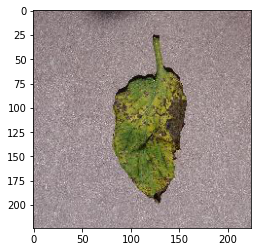

In [26]:
import numpy as np
from tensorflow.keras.preprocessing import image
test_image = image.load_img('../input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Septoria_leaf_spot/0b4886e5-a065-44c1-aa19-bd166922d3de___JR_Sept.L.S 8498_180deg.JPG', target_size = (224, 224))
imgplot = plt.imshow(test_image)
test_image = image.img_to_array(test_image)
test_image=test_image/255
test_image = np.expand_dims(test_image, axis = 0)
preds = model.predict(test_image)

preds = np.argmax(preds, axis=1)

if preds==0:
  print("Tomato - Bacterial Spot")
elif preds==1:
  print("Tomato - Early Blight")
elif preds==2:
  print("Tomato - Late Blight")
elif preds==3:
  print("Tomato - Leaf Mold")
elif preds==4:
  print("Tomato - Septoria Leaf Spot")
elif preds==5:
  print("Tomato - Spider Mites Two-spotted Spider Mite")
elif preds==6:
  print("Tomato - Target Spot")
elif preds==7:
  print("Tomato - Tomato_Yellow_Leaf_Curl_Virus")
elif preds==8:
  print("Tomato - Tomato Mosaic Virus")
else:
  print("Tomato - Healthy ")

Tomato - Spider Mites Two-spotted Spider Mite


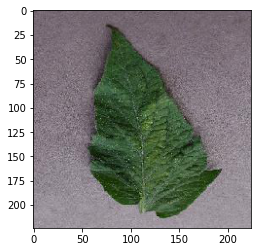

In [27]:
import numpy as np
from tensorflow.keras.preprocessing import image
test_image = image.load_img('../input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Spider_mites Two-spotted_spider_mite/00bc7858-1dca-4bfb-a828-225f03bd72a5___Com.G_SpM_FL 9455.JPG', target_size = (224, 224))
imgplot = plt.imshow(test_image)
test_image = image.img_to_array(test_image)
test_image=test_image/255
test_image = np.expand_dims(test_image, axis = 0)
preds = model.predict(test_image)

preds = np.argmax(preds, axis=1)

if preds==0:
  print("Tomato - Bacterial Spot")
elif preds==1:
  print("Tomato - Early Blight")
elif preds==2:
  print("Tomato - Late Blight")
elif preds==3:
  print("Tomato - Leaf Mold")
elif preds==4:
  print("Tomato - Septoria Leaf Spot")
elif preds==5:
  print("Tomato - Spider Mites Two-spotted Spider Mite")
elif preds==6:
  print("Tomato - Target Spot")
elif preds==7:
  print("Tomato - Tomato_Yellow_Leaf_Curl_Virus")
elif preds==8:
  print("Tomato - Tomato Mosaic Virus")
else:
  print("Tomato - Healthy ")

In [ ]:
../input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Spider_mites Two-spotted_spider_mite/00bc7858-1dca-4bfb-a828-225f03bd72a5___Com.G_SpM_FL 9455.JPG

In [28]:
import numpy as np
import os
 
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import load_model
from keras import models

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import os
import numpy as np
import matplotlib.pyplot as plt



In [29]:
test_image = load_img('../input/tomato/New Plant Diseases Dataset(Augmented)/valid/Tomato___Septoria_leaf_spot/0b4886e5-a065-44c1-aa19-bd166922d3de___JR_Sept.L.S 8498_180deg.JPG', target_size = (224, 224)) 
 
test_image = np.expand_dims(img_to_array(test_image)/255 , axis = 0) 


(1, 224, 224, 3)


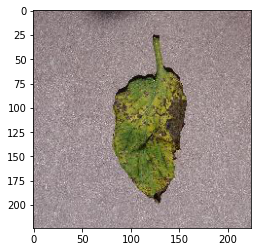

In [30]:
print(test_image.shape)
  

import matplotlib.pyplot as plt
plt.imshow(test_image[0])
plt.show()

In [31]:
result = model.predict(test_image)
  
print('Raw result = ', result)
   
pred = np.argmax(result , axis=1) 

@@ Raw result =  [[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


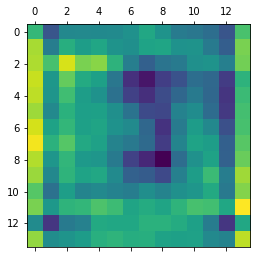

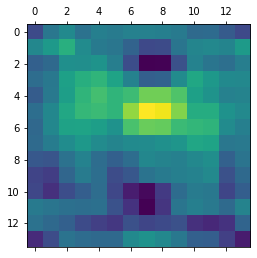

In [32]:
layer_outputs = [layer.output for layer in model.layers[:134]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
activations = activation_model.predict(test_image)
plt.matshow(activations[100][0, :, :, 1], cmap ='viridis')
plt.matshow(activations[100][0, :, :, 2], cmap ='viridis')




/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


IndexError: too many indices for array: array is 2-dimensional, but 4 were indexed

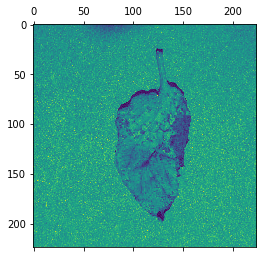

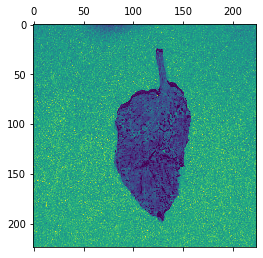

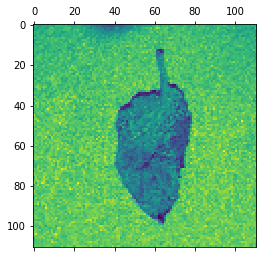

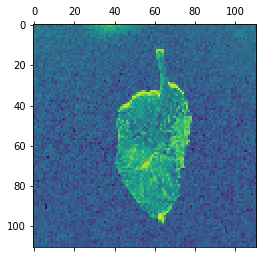

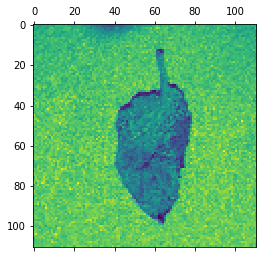

...

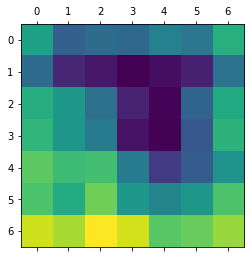

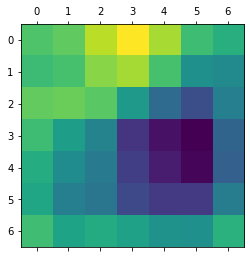

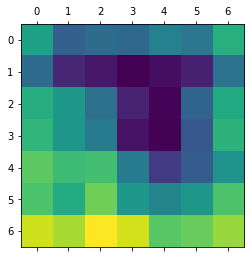

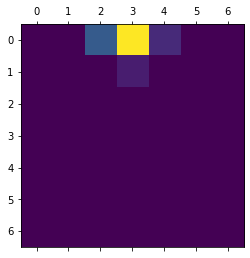

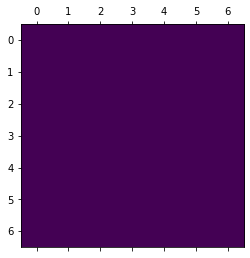

In [34]:
layer_outputs = [layer.output for layer in model.layers[:134]]
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)
activations = activation_model.predict(test_image)
for i in range(134):
    act=activations[i]
    plt.matshow(act[0, :, :, 1], cmap ='viridis')
    plt.matshow(act[0, :, :, 2], cmap ='viridis')




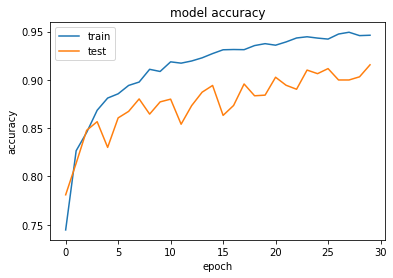

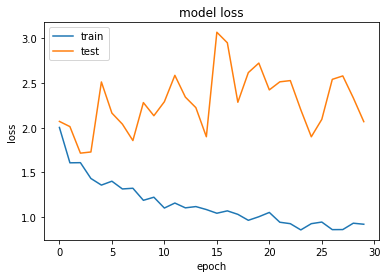

In [36]:
plt.plot(r.history['accuracy'])
plt.plot(r.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(r.history['loss'])
plt.plot(r.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()